In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")

from datetime import datetime

from sklearn.preprocessing import MinMaxScaler

In [2]:
path = 'C:/Users/jihoon.nam/Downloads/CPC 주조조건 데이터/CM7/3월/20230311~20230320_CM7.xlsx'
df = pd.read_excel(path)

In [3]:
FP_df = df[df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP']

# UNIX 시간 복원
FP_df['cnt_time'] = FP_df['cnt_time'].apply(lambda x: datetime.utcfromtimestamp(int(x)//1000))
FP_df.head(10)

,idx,ae_name,cnt_name,cnt_data,cnt_time
31,3309,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,2.0,2023-03-10 15:00:31
33,3503,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,0.0,2023-03-10 15:00:33
37,3746,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,31.0,2023-03-10 15:00:35
39,4017,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,329.0,2023-03-10 15:00:37
41,4166,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,613.0,2023-03-10 15:00:39
44,4326,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,814.0,2023-03-10 15:00:40
45,4430,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,815.0,2023-03-10 15:00:41
49,4593,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,814.0,2023-03-10 15:00:42
52,4745,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,857.0,2023-03-10 15:00:43
54,4940,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FP,892.0,2023-03-10 15:00:45


In [4]:
P_df = df[df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.CAST_OUT_ACTION_TO_PQ_VAL']

# UNIX 시간 복원
P_df['cnt_time'] = P_df['cnt_time'].apply(lambda x: datetime.utcfromtimestamp(int(x)//1000))
P_df.head(3)

,idx,ae_name,cnt_name,cnt_data,cnt_time
35,3728,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.CAST_OUT_...,-3121.0,2023-03-10 15:00:35
46,4414,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.CAST_OUT_...,0.0,2023-03-10 15:00:41
53,4744,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.CAST_OUT_...,22886.0,2023-03-10 15:00:43


In [5]:
T_df = df[df['cnt_name']=='CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FT']

# UNIX 시간 복원
T_df['cnt_time'] = T_df['cnt_time'].apply(lambda x: datetime.utcfromtimestamp(int(x)//1000))
T_df.head(3)

,idx,ae_name,cnt_name,cnt_data,cnt_time
1,114,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FT,734.0,2023-03-10 15:00:01
4,447,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FT,733.9,2023-03-10 15:00:04
7,672,PLC_CPC_LineB,CPC_LineB.CPC_PLCB.Global.CM7_DATA_x.COM_PV_FT,733.7,2023-03-10 15:00:06


In [6]:
# 정규화
scaler = MinMaxScaler()

normalized_FP = FP_df.copy() # 보온로 압력
normalized_P = P_df.copy() # 공압 센서
normalized_T = T_df.copy() # 용탕 온도


numerical = ['cnt_data']
normalized_FP[numerical] = scaler.fit_transform(normalized_FP[numerical])
normalized_P[numerical] = scaler.fit_transform(normalized_P[numerical])
normalized_T[numerical] = scaler.fit_transform(normalized_T[numerical])

df_list = [normalized_FP, normalized_P, normalized_T]

In [7]:
# 리샘플링
resampled_list = []
for i in df_list:
    temp = i.set_index('cnt_time')
    resampled_list.append(temp.resample('7S').mean())

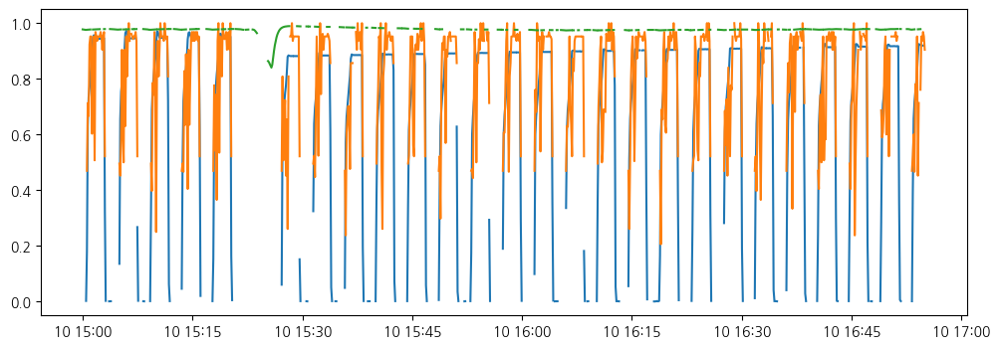

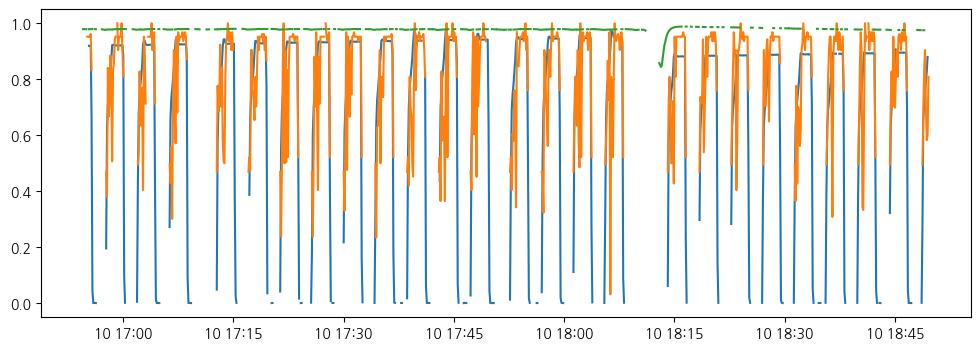

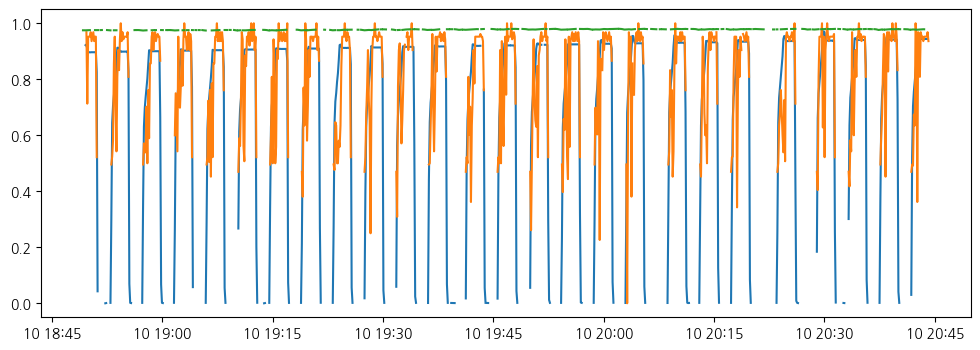

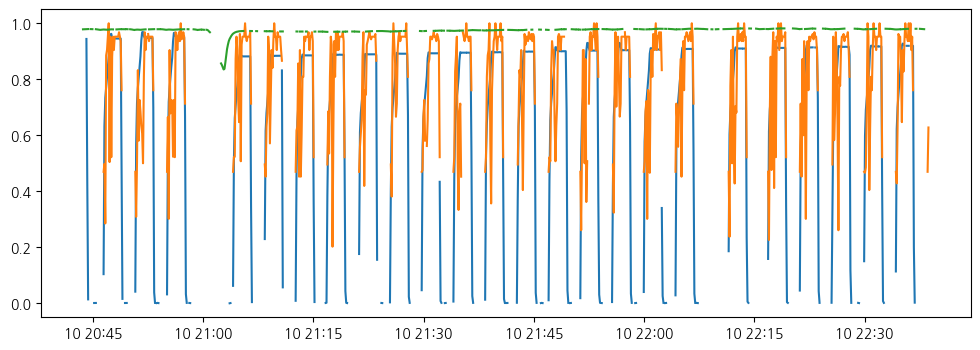

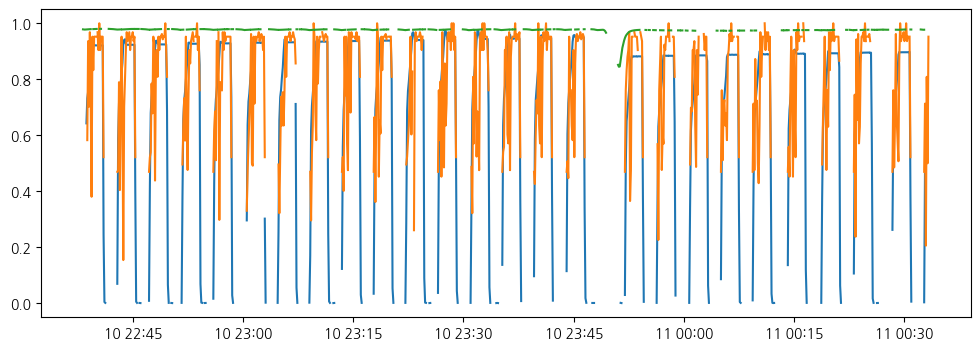

...

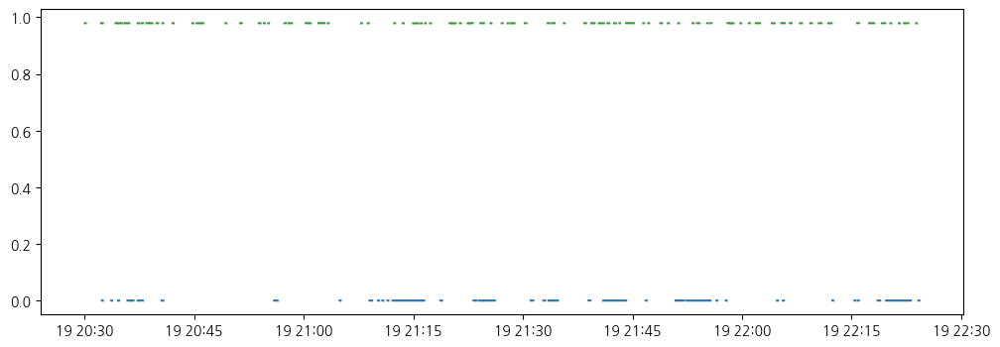

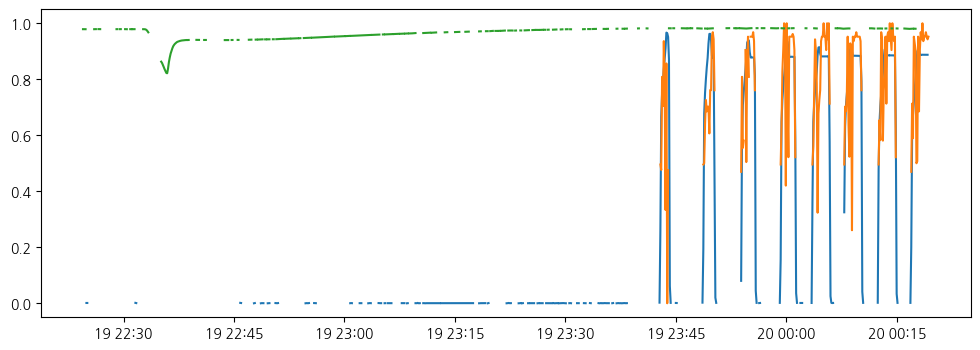

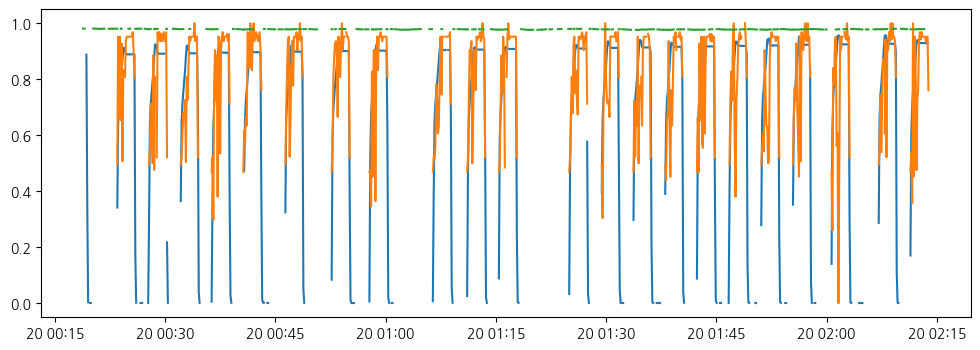

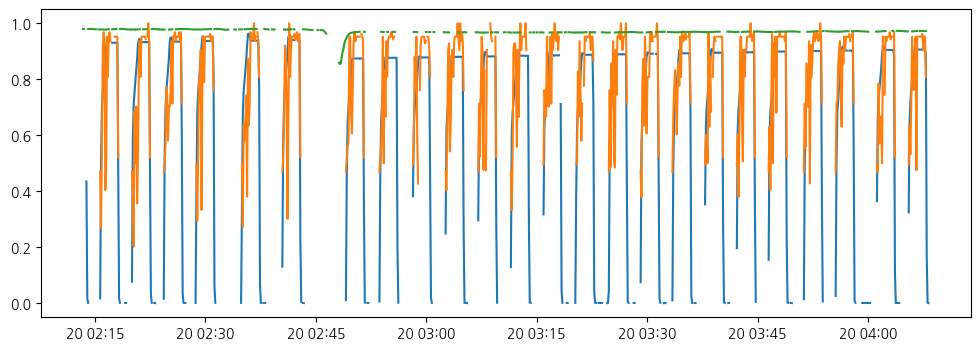

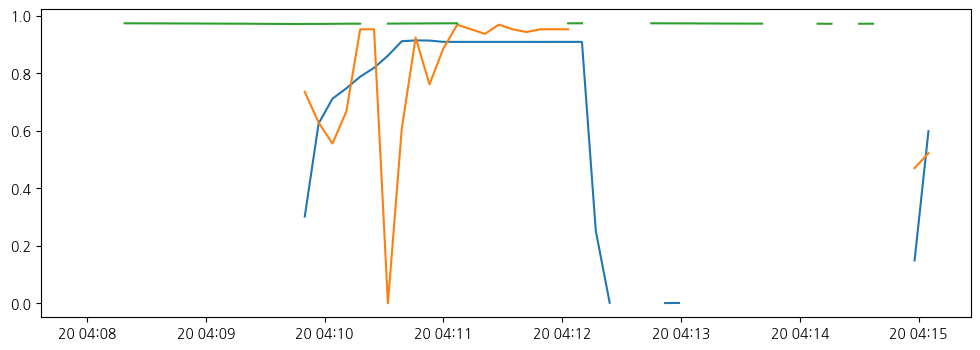

In [8]:
# 리샘플링 후 
i = 0
size = len(resampled_list[0])//120 # 10일(240시간) / 120 =  2시간
while i * size < len(resampled_list[0]):
    plt.figure(figsize=(12,4))
    
    for j in range(3):
        #plt.plot(resampled_list[j][i*size:(i+1)*size]['cnt_time'], resampled_list[j][i*size:(i+1)*size]['cnt_data'])    
        plt.plot(resampled_list[j][i*size:(i+1)*size]['cnt_data'])    
        
    i += 1